In [1]:
import os
import re
import string
import torch
from torch import nn
from torch.nn import functional as F
if not "CHDIR_FLAG" in dir():
    os.chdir("../")
    CHDIR_FLAG = True

import numpy as np
import pandas as pd
from datasets import load_dataset

from src.tools.torch import register_forward_hook_decorator, register_backward_hook_decorator
from src.tools.plot import plot_tensor_histogram, plot_tensor_heatmap
from transformers import AutoTokenizer, AutoModelForCausalLM, AutoConfig

import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline

from src.pipelines.analysis import horizontal_comparison_of_forward_hook, vertical_comparison_of_forward_hook

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

def display_generation_results(model_path, table_path):
    tokenizer = AutoTokenizer.from_pretrained(model_path)
    df = pd.read_csv(table_path, sep='\t', header=0)
    token_ids = df["id"].tolist()
    tokens = tokenizer.decode(token_ids)
    print(tokens)

# Hook Data 测试

In [2]:
comparison_index = ["mean_diff", "max_diff", "sim", "robust_sim"]
max_length = 16
figure_size = 5
outlier_ratio = .1

## Qwen1.5-7B

- 与之前得到的同样结论：头尾层的输入输出相关系数非常低，中间普遍相关系数高
- Qweb1.5-7B中的第2层和第8层的输入输出发生突变，尤其是第8层，突变得非常厉害（相关系数也同时腰斩）
- Qwen1.5-7B的最后一层相关系数跌到负数，比之前的还要狠

In [3]:
hook_data_paths = [
    r"./results/qwen1.5-7b-generate-case-study/fhook+Qwen1.5-7B+True-0.pt",
    r"./results/qwen1.5-7b-generate-case-study/fhook+Qwen1.5-7B+True-1.pt",
    r"./results/qwen1.5-7b-generate-case-study/fhook+Qwen1.5-7B+True-2.pt",
    r"./results/qwen1.5-7b-generate-case-study/fhook+Qwen1.5-7B+True-3.pt",
    r"./results/qwen1.5-7b-generate-case-study/fhook+Qwen1.5-7B+True-4.pt",
    r"./results/qwen1.5-7b-generate-case-study/fhook+Qwen1.5-7B+True-5.pt",
    r"./results/qwen1.5-7b-generate-case-study/fhook+Qwen1.5-7B+True-6.pt",
]
table_data_paths = [
    r"./results/qwen1.5-7b-generate-case-study/decode+Qwen1.5-7B+True-0.csv",
    r"./results/qwen1.5-7b-generate-case-study/decode+Qwen1.5-7B+True-1.csv",
    r"./results/qwen1.5-7b-generate-case-study/decode+Qwen1.5-7B+True-2.csv",
    r"./results/qwen1.5-7b-generate-case-study/decode+Qwen1.5-7B+True-3.csv",
    r"./results/qwen1.5-7b-generate-case-study/decode+Qwen1.5-7B+True-4.csv",
    r"./results/qwen1.5-7b-generate-case-study/decode+Qwen1.5-7B+True-5.csv",
    r"./results/qwen1.5-7b-generate-case-study/decode+Qwen1.5-7B+True-6.csv",    
]
model_path = r"D:\resource\model\huggingface\Qwen\Qwen1.5-7B"
model_config = AutoConfig.from_pretrained(model_path)
num_hidden_layers = model_config.num_hidden_layers

### Case 1（很久很久以前）

In [4]:
display_generation_results(model_path, table_data_paths[0])
df = pd.read_csv(table_data_paths[0], sep='\t', header=0)
df

，有一个叫盘古的巨人，在混沌中睡了十万八千年。有一天，他突然醒了，只听得一声巨响，他缓缓地睁开眼睛，舒展一下筋骨，举目四望，周围一片漆黑，什么也看不见。他觉得很奇怪，又用力睁开眼睛，这一


,id,token,prob,max_id,cand_tokens,cand_probs,eos_prob
0,3837,，,0.584621,3837,"['，', '，在', ',']","[0.5846, 0.1007, 0.0641]",1.900046e-05
1,104133,有一个,0.108375,104133,"['有一个', '人们', '有一']","[0.1084, 0.0509, 0.0488]",5.524631e-06
2,99882,叫,0.092605,99882,"['叫', '国王', '小']","[0.0926, 0.0558, 0.0327]",4.411813e-06
3,99665,盘,0.076236,99665,"['盘', '“', '阿']","[0.0762, 0.0611, 0.0478]",7.606710e-07
4,99470,古,0.998355,99470,"['古', '古老', '瓠']","[0.9984, 0.0003, 0.0002]",8.395579e-10
5,9370,的,0.396141,9370,"['的', '的人', '的大']","[0.3961, 0.2363, 0.1693]",9.092719e-07
6,112329,巨人,0.912247,112329,"['巨人', '男孩', '神']","[0.9122, 0.0235, 0.0189]",1.685915e-07
7,96050,，在,0.798477,96050,"['，在', '，', '。']","[0.7985, 0.1217, 0.0495]",8.933051e-07
8,117100,混沌,0.571566,117100,"['混沌', '宇宙', '茫茫']","[0.5716, 0.1629, 0.0745]",1.854135e-07
9,15946,中,0.724688,15946,"['中', '之中', '天地']","[0.7247, 0.1676, 0.0484]",2.421294e-07


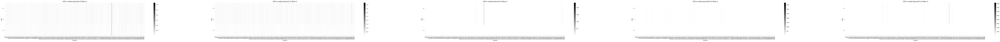

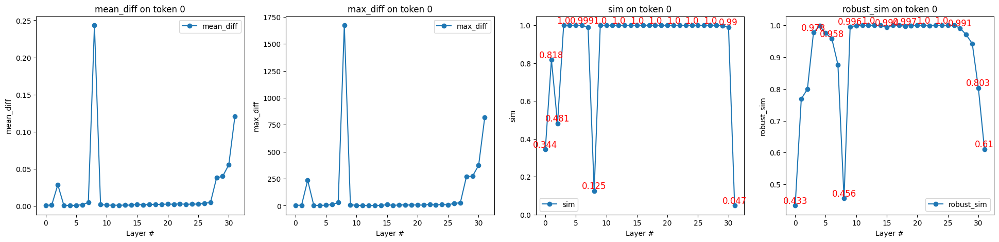

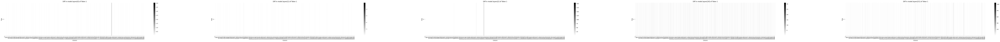

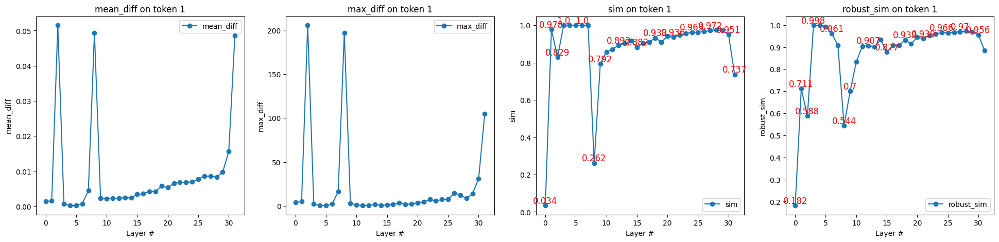

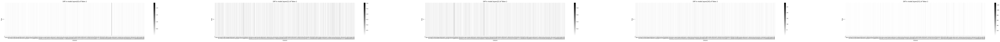

...

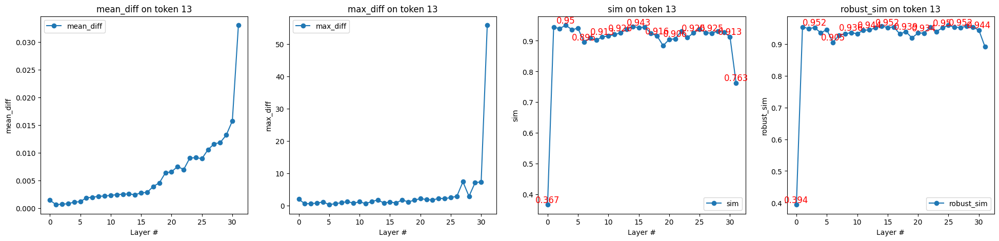

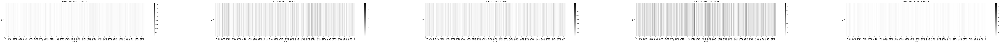

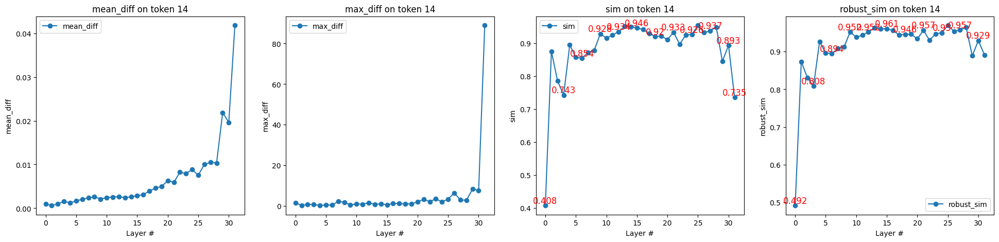

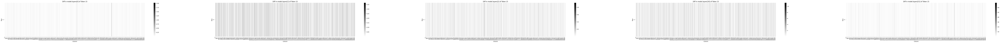

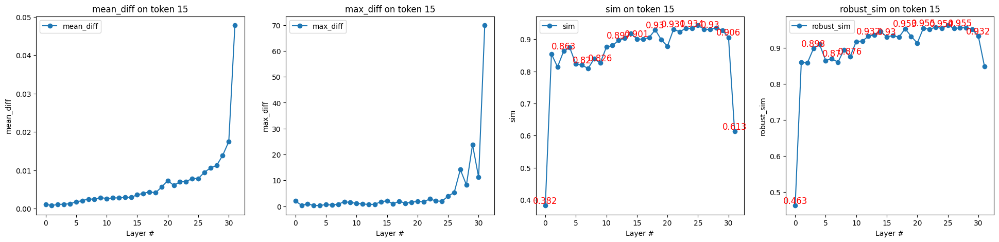

In [5]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[0], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

### Case 2（解方程：x^2 - 3x + 2 = 0）

token8 的生成在 layer3 和 layer8 处发生突变，同样这个token是标点之后的一个token

In [6]:
display_generation_results(model_path, table_data_paths[1])
df = pd.read_csv(table_data_paths[1], sep='\t', header=0)
df



这是一个一元二次方程，可以使用求根公式来求解。
首先，根据求根公式，可以得到：
x = (-b ± √(b^2 - 4ac)) / 2a
其中，a = 1，b = -3，c = 2


,id,token,prob,max_id,cand_tokens,cand_probs,eos_prob
0,271,\n\n,0.397050,271,"['\n\n', '\n', '。\n\n']","[0.397, 0.2491, 0.0822]",9.052161e-04
1,105464,这是一个,0.116816,105464,"['这是一个', 'x', '使用']","[0.1168, 0.1056, 0.1054]",2.346000e-07
2,14777,一,0.490335,14777,"['一', '二次', '标准']","[0.4903, 0.3101, 0.0572]",2.420958e-07
3,23305,元,0.999899,23305,"['元', '阶', '二次']","[0.9999, 0.0001, 0.0]",2.899281e-10
4,105935,二次,0.999339,105935,"['二次', '一次', '方']","[0.9993, 0.0003, 0.0002]",2.223154e-09
5,23384,方,0.999931,23384,"['方', '的', '程']","[0.9999, 0.0, 0.0]",3.946488e-10
6,38507,程,0.994919,38507,"['程', '程式', '方']","[0.9949, 0.005, 0.0]",6.925257e-09
7,3837,，,0.916832,3837,"['，', '。', '的标准']","[0.9168, 0.0525, 0.0068]",1.958710e-07
8,73670,可以,0.506016,73670,"['可以', '可以用', '可以通过']","[0.506, 0.146, 0.1294]",2.489185e-07
9,37029,使用,0.955873,37029,"['使用', '采用', '利用']","[0.9559, 0.0152, 0.0116]",1.245254e-08


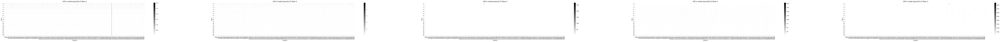

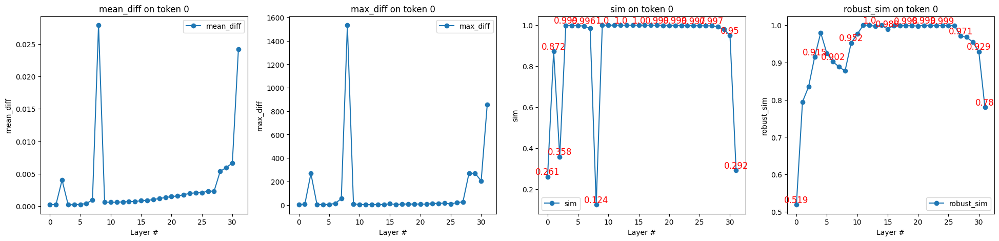

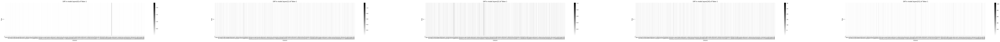

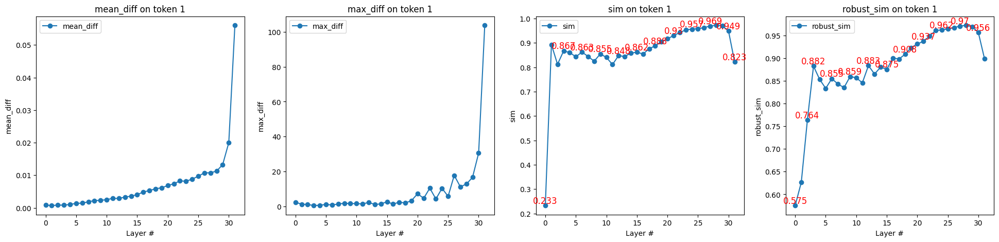

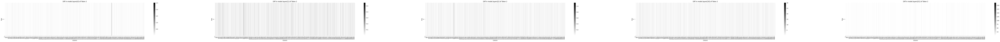

...

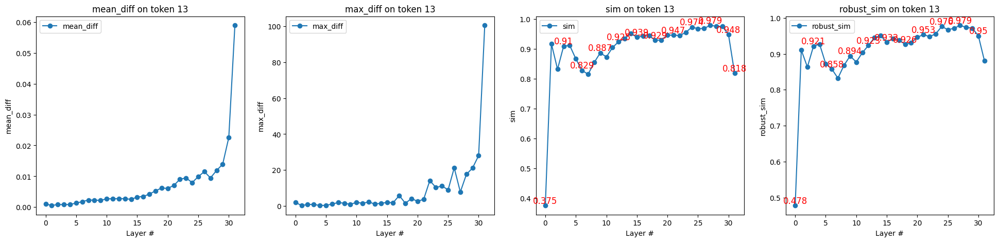

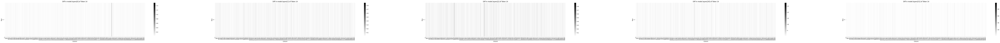

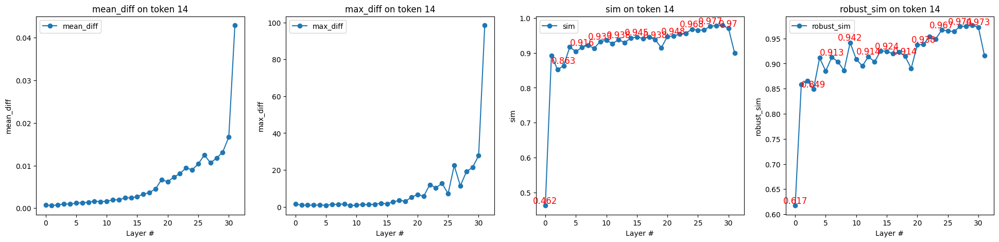

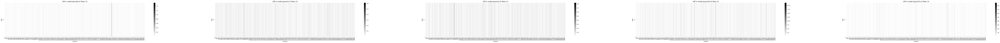

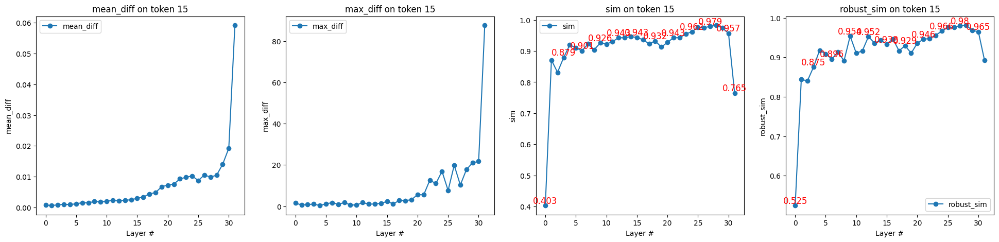

In [7]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[1], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

### Case 3（使用python写一段冒泡排序算法）

从这边来看，大部分diff都是递增上升的，突变往往发生在标点符号之后的第一个token生成，但这只是必要条件，并非充分条件

In [8]:
display_generation_results(model_path, table_data_paths[2])
df = pd.read_csv(table_data_paths[2], sep='\t', header=0)
df


好的，以下是Python实现的冒泡排序算法：

```python
def bubble_sort(arr):
    n = len(arr)
    # 遍历所有数组元素
    for i in range(n):
        # 最后i个元素已经排好序了，不需要再比较
        for j in


,id,token,prob,max_id,cand_tokens,cand_probs,eos_prob
0,198,\n,0.371158,198,"['\n', '\n\n', ' ']","[0.3712, 0.1875, 0.0679]",5.965434e-05
1,99692,好的,0.575219,99692,"['好的', '当然', '以下是']","[0.5752, 0.1324, 0.1094]",2.422750e-08
2,3837,，,0.967214,3837,"['，', '，请', '！']","[0.9672, 0.0316, 0.0008]",9.947466e-10
3,114566,以下是,0.632963,114566,"['以下是', '下面是', '以下']","[0.633, 0.2672, 0.0464]",1.662355e-09
4,30280,Python,0.672563,30280,"['Python', '使用', '用']","[0.6726, 0.151, 0.0612]",4.879973e-09
5,101884,实现,0.555876,101884,"['实现', '中', '语言']","[0.5559, 0.1558, 0.0875]",2.913675e-08
6,9370,的,0.872438,9370,"['的', '冒', '的一种']","[0.8724, 0.1256, 0.0003]",3.174976e-10
7,100303,冒,0.998141,100303,"['冒', '简单', '示']","[0.9981, 0.0012, 0.0002]",6.234205e-10
8,100454,泡,0.999994,100454,"['泡', '泡泡', '泡沫']","[1.0, 0.0, 0.0]",3.082385e-11
9,74661,排序,0.999757,74661,"['排序', '算法', '排']","[0.9998, 0.0001, 0.0001]",1.110756e-10


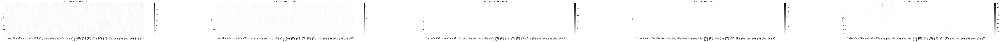

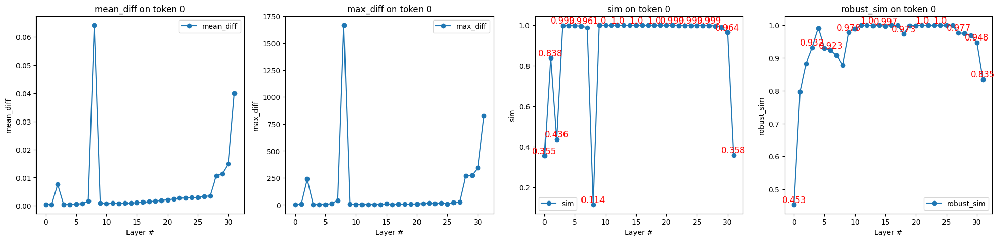

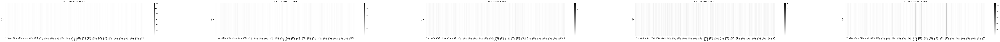

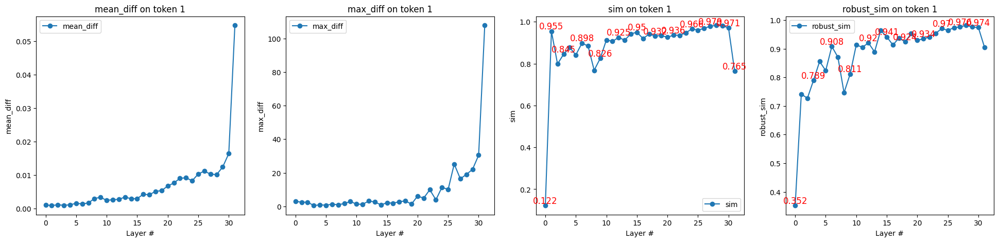

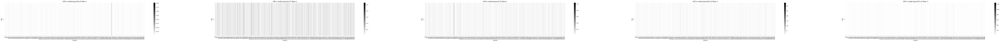

...

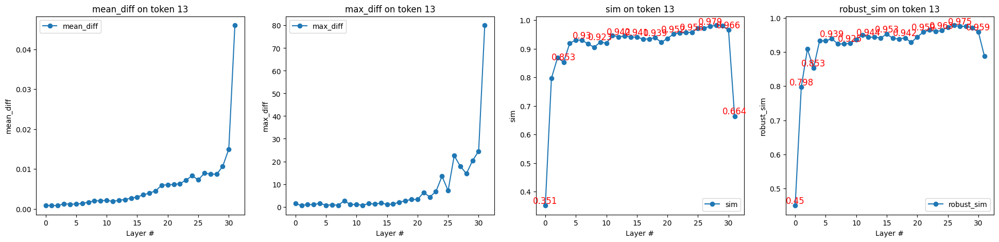

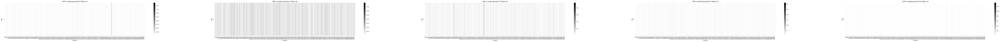

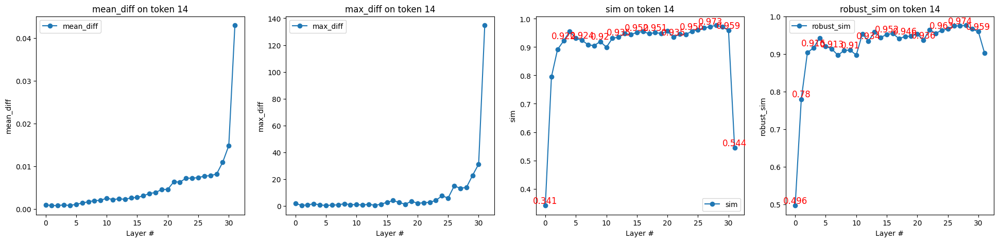

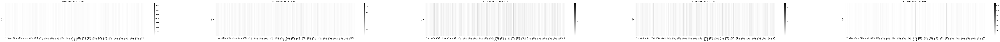

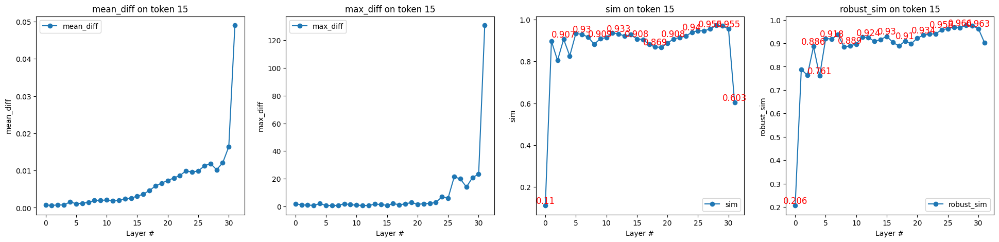

In [9]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[2], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

### Case 4（我今年20岁，妹妹的年龄是我的一半。则我40岁时，我的妹妹多少岁？）

In [10]:
display_generation_results(model_path, table_data_paths[3])
df = pd.read_csv(table_data_paths[3], sep='\t', header=0)
df

（　　）
A. 10
B. 20
C. 30
D. 40
答案：B
解：设我今年20岁，妹妹的年龄是x岁，根据题意可得： 20+x=2x， 解得


,id,token,prob,max_id,cand_tokens,cand_probs,eos_prob
0,9909,（,0.303234,9909,"['（', ' 解', ' A']","[0.3032, 0.1651, 0.081]",1.370509e-02
1,22441,,0.492182,22441,"['\u3000', ' ', '列']","[0.4922, 0.1274, 0.1027]",8.222002e-06
2,22441,,0.996443,22441,"['\u3000', '）', '）\n']","[0.9964, 0.0019, 0.0009]",9.651279e-09
3,23083,）\n,0.711310,23083,"['）\n', '）', '）\n\n']","[0.7113, 0.2547, 0.0331]",6.964074e-10
4,32,A,0.998507,32,"['A', '解', '�']","[0.9985, 0.0006, 0.0004]",3.692943e-09
5,13,.,0.999030,13,"['.', '、', '．']","[0.999, 0.0009, 0.0]",2.643514e-08
6,220,,0.996896,220,"[' ', ' �', ' （']","[0.9969, 0.0005, 0.0005]",5.707228e-08
7,16,1,0.519754,16,"['1', '2', '4']","[0.5198, 0.4474, 0.012]",4.434173e-09
8,15,0,0.769681,15,"['0', '5', '2']","[0.7697, 0.1127, 0.0426]",7.967117e-09
9,198,\n,0.912887,198,"['\n', '岁', ' �']","[0.9129, 0.082, 0.0014]",3.712179e-07


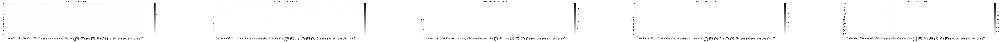

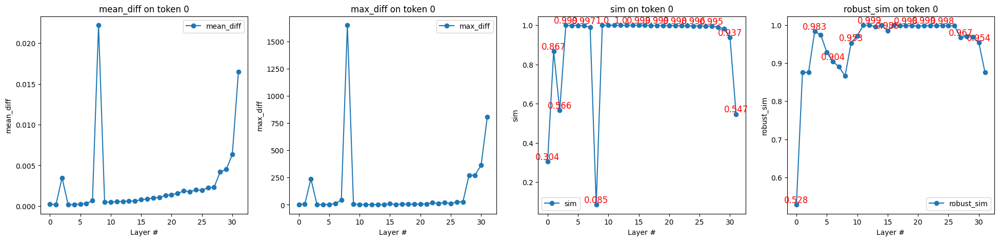

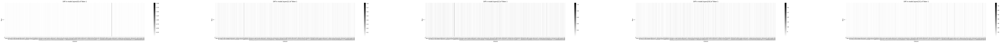

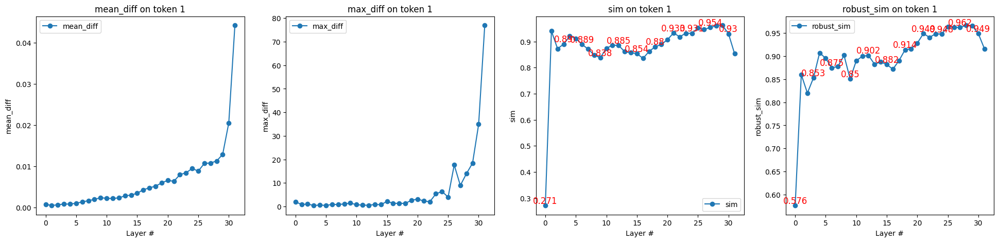

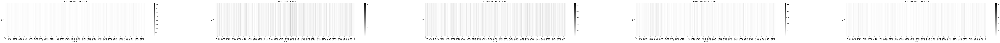

...

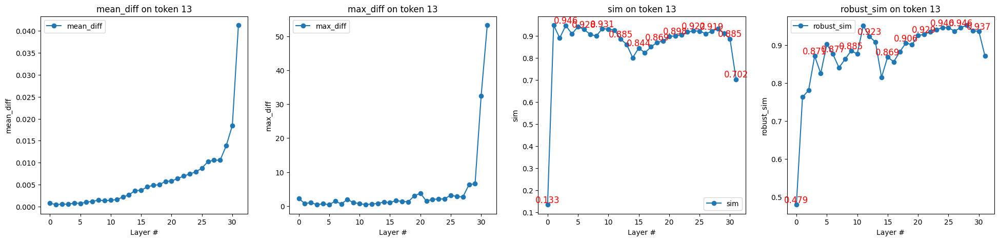

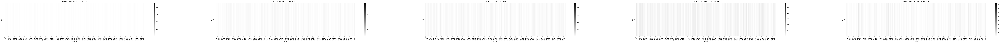

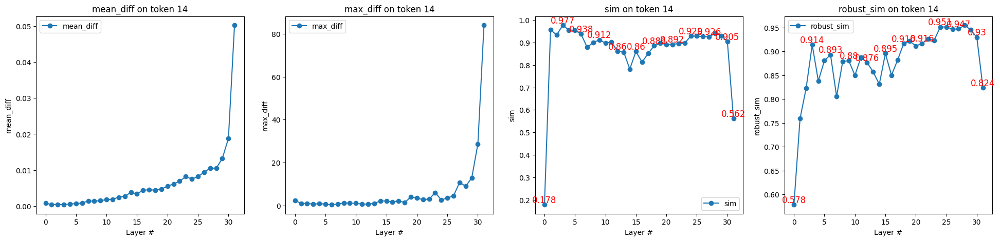

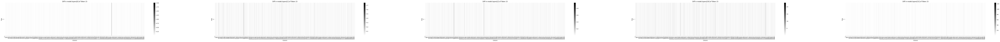

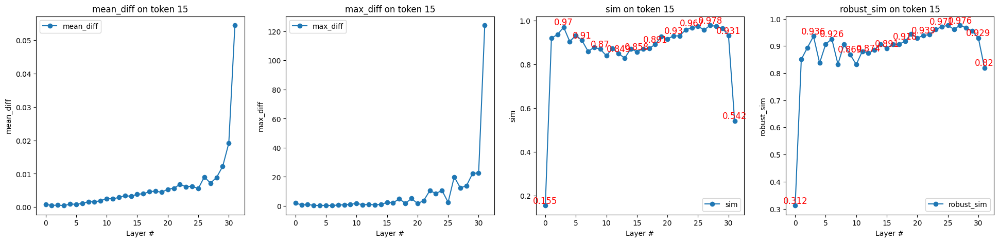

In [11]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[3], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

### Case 5（素因子分解：126。）

这个直接就endoftext了

In [12]:
display_generation_results(model_path, table_data_paths[4])
df = pd.read_csv(table_data_paths[4], sep='\t', header=0)
df

<|endoftext|>


,id,token,prob,max_id,cand_tokens,cand_probs,eos_prob
0,151643,<|endoftext|>,0.179786,151643,"['<|endoftext|>', ' ', '<|im_end|>']","[0.1798, 0.1025, 0.0643]",0.179786


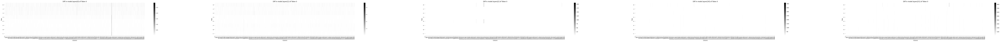

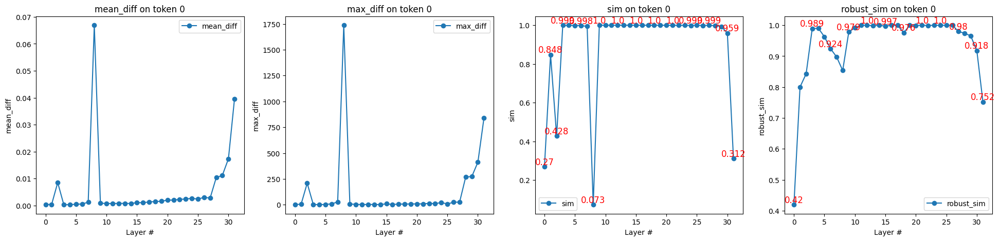

IndexError: list index out of range

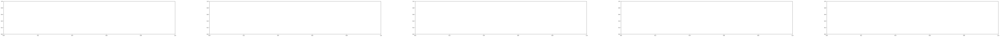

In [13]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[4], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

### Case 6（请使用markdown语法编写一个3行4列的表格，表头为“姓名”、“年龄”、“性别”，剩余3行请随机构造3个人物的姓名、年龄以及性别填写。）

在这个案例中，生成的结果明显会在男女以及年龄的随机性上有很强的偏好性。

In [ ]:
display_generation_results(model_path, table_data_paths[5])
df = pd.read_csv(table_data_paths[5], sep='\t', header=0)
df

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[5], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

### Case 7（请写一首七言律诗作为中华人民共和国成立八十周年的祝词，注意用词的平仄押韵：《八十周年庆》）

In [ ]:
display_generation_results(model_path, table_data_paths[6])
df = pd.read_csv(table_data_paths[6], sep='\t', header=0)
df

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[6], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

## Qwen2.5-7B-Instruct

In [ ]:
hook_data_paths = [
    r"./results/qwen2.5-7b-instruct-generate-case-study/fhook+qwen2.5-7b-instruct+True-0.pt",
    r"./results/qwen2.5-7b-instruct-generate-case-study/fhook+qwen2.5-7b-instruct+True-1.pt",
    r"./results/qwen2.5-7b-instruct-generate-case-study/fhook+qwen2.5-7b-instruct+True-2.pt",
    r"./results/qwen2.5-7b-instruct-generate-case-study/fhook+qwen2.5-7b-instruct+True-3.pt",
    r"./results/qwen2.5-7b-instruct-generate-case-study/fhook+qwen2.5-7b-instruct+True-4.pt",
    r"./results/qwen2.5-7b-instruct-generate-case-study/fhook+qwen2.5-7b-instruct+True-5.pt",
    r"./results/qwen2.5-7b-instruct-generate-case-study/fhook+qwen2.5-7b-instruct+True-6.pt",
]
table_data_paths = [
    r"./results/qwen2.5-7b-instruct-generate-case-study/decode+qwen2.5-7b-instruct+True-0.csv",
    r"./results/qwen2.5-7b-instruct-generate-case-study/decode+qwen2.5-7b-instruct+True-1.csv",
    r"./results/qwen2.5-7b-instruct-generate-case-study/decode+qwen2.5-7b-instruct+True-2.csv",
    r"./results/qwen2.5-7b-instruct-generate-case-study/decode+qwen2.5-7b-instruct+True-3.csv",
    r"./results/qwen2.5-7b-instruct-generate-case-study/decode+qwen2.5-7b-instruct+True-4.csv",
    r"./results/qwen2.5-7b-instruct-generate-case-study/decode+qwen2.5-7b-instruct+True-5.csv",
    r"./results/qwen2.5-7b-instruct-generate-case-study/decode+qwen2.5-7b-instruct+True-6.csv",    
]
model_path = r"D:\resource\model\huggingface\Qwen\Qwen2.5-7B-Instruct"
model_config = AutoConfig.from_pretrained(model_path)
num_hidden_layers = model_config.num_hidden_layers

### Case 1（很久很久以前）

In [ ]:
display_generation_results(model_path, table_data_paths[0])
df = pd.read_csv(table_data_paths[0], sep='\t', header=0)
df

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[0], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = ["mean_diff", "max_diff", "sim", "robust_sim"],
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

### Case 2（解方程：x^2 - 3x + 2 = 0）

In [ ]:
display_generation_results(model_path, table_data_paths[1])
df = pd.read_csv(table_data_paths[1], sep='\t', header=0)
df

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[1], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = ["mean_diff", "max_diff", "sim", "robust_sim"],
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

### Case 3（使用python写一段冒泡排序算法）

In [ ]:
display_generation_results(model_path, table_data_paths[2])
df = pd.read_csv(table_data_paths[2], sep='\t', header=0)
df

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[2], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = ["mean_diff", "max_diff", "sim", "robust_sim"],
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

### Case 4（我今年20岁，妹妹的年龄是我的一半。则我40岁时，我的妹妹多少岁？）

In [ ]:
display_generation_results(model_path, table_data_paths[3])
df = pd.read_csv(table_data_paths[3], sep='\t', header=0)
df

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[3], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = ["mean_diff", "max_diff", "sim", "robust_sim"],
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

### Case 5（素因子分解：126。）

这个直接就endoftext了

In [ ]:
display_generation_results(model_path, table_data_paths[4])
df = pd.read_csv(table_data_paths[4], sep='\t', header=0)
df

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[4], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = ["mean_diff", "max_diff", "sim", "robust_sim"],
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

### Case 6（请使用markdown语法编写一个3行4列的表格，表头为“姓名”、“年龄”、“性别”，剩余3行请随机构造3个人物的姓名、年龄以及性别填写。）

在这个案例中，生成的结果明显会在男女以及年龄的随机性上有很强的偏好性。

In [ ]:
display_generation_results(model_path, table_data_paths[5])
df = pd.read_csv(table_data_paths[5], sep='\t', header=0)
df

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[5], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = ["mean_diff", "max_diff", "sim", "robust_sim"],
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

### Case 7（请写一首七言律诗作为中华人民共和国成立八十周年的祝词，注意用词的平仄押韵：《八十周年庆》）

In [ ]:
display_generation_results(model_path, table_data_paths[6])
df = pd.read_csv(table_data_paths[6], sep='\t', header=0)
df

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_paths[6], 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers)],
    comparison_index = ["mean_diff", "max_diff", "sim", "robust_sim"],
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 2, num_hidden_layers - 1]],
    outlier_ratio = outlier_ratio,
)

# Skip Layer test

对于Qwen1.5-7B而言，输入输出的突变发生在第7层，而且这一层的相关系数调到了零以下（基本可以认为是没有任何线性相关性）

In [ ]:
comparison_index = ["mean_diff", "max_diff", "sim", "robust_sim"]
max_length = 16
figure_size = 5
outlier_ratio = .1

## Qwen1.5-7B

这边每个测试了只跳过1层的生成情况：

- 目前看下来除了第7、8层被跳过后输出的是循环（第），其余都是正常的（前三层同样不能跳，属于是预料之中的）

- skip layer之后，对第7 8 层的影响很大，这说明这两层是包含了重要信息的。

- 我的假设是，每一层其实接收的输入都是有一个定义域空间的，同样的，值域也对应一个空间，如果输入在定义域中，理论上就应该是比较稳定的（输入输出的差异不大，且相似度高，且差异随层增加不断扩大），如果不在定义域中，当然就会很糟糕

In [ ]:
hook_data_paths = [
    r"./results/qwen1.5-7b-skip-layer-case-study/fhook+Qwen1.5-7B+True-0-skip{}.pt",
    r"./results/qwen1.5-7b-skip-layer-case-study/fhook+Qwen1.5-7B+True-1-skip{}.pt",
    r"./results/qwen1.5-7b-skip-layer-case-study/fhook+Qwen1.5-7B+True-2-skip{}.pt",
    r"./results/qwen1.5-7b-skip-layer-case-study/fhook+Qwen1.5-7B+True-3-skip{}.pt",
    r"./results/qwen1.5-7b-skip-layer-case-study/fhook+Qwen1.5-7B+True-4-skip{}.pt",
    r"./results/qwen1.5-7b-skip-layer-case-study/fhook+Qwen1.5-7B+True-5-skip{}.pt",
    r"./results/qwen1.5-7b-skip-layer-case-study/fhook+Qwen1.5-7B+True-6-skip{}.pt",
]
table_data_paths = [
    r"./results/qwen1.5-7b-skip-layer-case-study/decode+Qwen1.5-7B+True-0-skip{}.csv",
    r"./results/qwen1.5-7b-skip-layer-case-study/decode+Qwen1.5-7B+True-1-skip{}.csv",
    r"./results/qwen1.5-7b-skip-layer-case-study/decode+Qwen1.5-7B+True-2-skip{}.csv",
    r"./results/qwen1.5-7b-skip-layer-case-study/decode+Qwen1.5-7B+True-3-skip{}.csv",
    r"./results/qwen1.5-7b-skip-layer-case-study/decode+Qwen1.5-7B+True-4-skip{}.csv",
    r"./results/qwen1.5-7b-skip-layer-case-study/decode+Qwen1.5-7B+True-5-skip{}.csv",
    r"./results/qwen1.5-7b-skip-layer-case-study/decode+Qwen1.5-7B+True-6-skip{}.csv",    
]
model_path = r"D:\resource\model\huggingface\Qwen\Qwen1.5-7B"
model_config = AutoConfig.from_pretrained(model_path)
num_hidden_layers = model_config.num_hidden_layers

### 标准输出

In [ ]:
table_path = "./results/qwen1.5-7b-generate-case-study/decode+Qwen1.5-7B+True-{}.csv"
hook_data_path = "./results/qwen1.5-7b-generate-case-study/fhook+Qwen1.5-7B+True-{}.pt"
for i in range(7):
    print(i)
    display_generation_results(model_path.format(i), table_path.format(i))
    print('-' * 64)

### Case 1（很久很久以前）

在这个例子中，和之前0.5B的模型不同，很明显只skip一个layer的话，大部分都能正常生成

In [ ]:
table_path_format = table_data_paths[0].format
hook_data_path_format = hook_data_paths[0].format
for i in range(31):
    print(i)
    print(table_path_format(str(i).zfill(2)))
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("00"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("01"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("02"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("03"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("04"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("05"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("06"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("07"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("08"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("29"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("30"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("31"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

### Case 2（解方程：x^2 - 3x + 2 = 0）

这个目前来看除了跳过**0,2,7,8**这几层（后面的一些结果说明其实第7层有时候是可以跳过的，从上面Hook Data测试的结果来看，其实第8层确实发生了输入输出的差异突变）

In [ ]:
table_path_format = table_data_paths[1].format
hook_data_path_format = hook_data_paths[1].format
for i in range(31):
    print(i)
    print(table_path_format(str(i).zfill(2)))
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("00"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("01"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("02"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("07"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("08"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("29"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("30"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

In [ ]:
vertical_comparison_of_forward_hook(
    hook_data = None,
    hook_data_path = hook_data_path_format("31"), 
    hook_module_names = [f"model.layers[{i}]" for i in range(num_hidden_layers - 1)],
    comparison_index = comparison_index,
    max_length = max_length,
    figure_size = figure_size,
    watched_module_names = [f"model.layers[{i}]" for i in [0, 1, 2, num_hidden_layers - 3, num_hidden_layers - 2]],
    outlier_ratio = outlier_ratio,
)

### Case 3（使用python写一段冒泡排序算法）

In [ ]:
table_path_format = table_data_paths[2].format
hook_data_path_format = hook_data_paths[2].format
for i in range(31):
    print(i)
    print(table_path_format(str(i).zfill(2)))
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

### Case 4（我今年20岁，妹妹的年龄是我的一半。则我40岁时，我的妹妹多少岁？）

In [ ]:
table_path_format = table_data_paths[3].format
hook_data_path_format = hook_data_paths[3].format
for i in range(31):
    print(i)
    print(table_path_format(str(i).zfill(2)))
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

### Case 5（素因子分解：126。）

In [ ]:
table_path_format = table_data_paths[4].format
hook_data_path_format = hook_data_paths[4].format
for i in range(31):
    print(i)
    print(table_path_format(str(i).zfill(2)))
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

### Case 6（请使用markdown语法编写一个3行4列的表格，表头为“姓名”、“年龄”、“性别”，剩余3行请随机构造3个人物的姓名、年龄以及性别填写。）

In [ ]:
table_path_format = table_data_paths[5].format
hook_data_path_format = hook_data_paths[5].format
for i in range(31):
    print(i)
    print(table_path_format(str(i).zfill(2)))
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

### Case 7（请写一首七言律诗作为中华人民共和国成立八十周年的祝词，注意用词的平仄押韵：《八十周年庆》）

In [ ]:
table_path_format = table_data_paths[6].format
hook_data_path_format = hook_data_paths[6].format
for i in range(31):
    print(i)
    print(table_path_format(str(i).zfill(2)))
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

## Qwen2.5-7B-Instruct

In [ ]:
model_path = r"D:\resource\model\huggingface\Qwen\Qwen2.5-7B-Instruct"

### 标准输出

In [ ]:
table_path = "./results/qwen2.5-7b-instruct-generate-case-study/decode+Qwen2.5-7B-Instruct+True-{}.csv"
hook_data_path = "./results/qwen2.5-7b-instruct-generate-case-study/fhook+Qwen2.5-7B-Instruct+True-{}.pt"
for i in range(7):
    print(i)
    display_generation_results(model_path.format(i), table_path.format(i))
    print('-' * 64)

### Case 1（很久很久以前）

In [ ]:
table_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/decode+Qwen2.5-7B-Instruct+True-0-skip{}.csv".format
hook_data_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/fhook+Qwen2.5-7B-Instruct+True-0-skip{}.pt".format
for i in range(28):
    print(i)
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

### Case 2（解方程：x^2 - 3x + 2 = 0）

In [ ]:
table_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/decode+Qwen2.5-7B-Instruct+True-1-skip{}.csv".format
hook_data_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/fhook+Qwen2.5-7B-Instruct+True-1-skip{}.pt".format
for i in range(28):
    print(i)
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

### Case 3（使用python写一段冒泡排序算法）

In [ ]:
table_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/decode+Qwen2.5-7B-Instruct+True-2-skip{}.csv".format
hook_data_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/fhook+Qwen2.5-7B-Instruct+True-2-skip{}.pt".format
for i in range(28):
    print(i)
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

### Case 4（我今年20岁，妹妹的年龄是我的一半。则我40岁时，我的妹妹多少岁？）

In [ ]:
table_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/decode+Qwen2.5-7B-Instruct+True-3-skip{}.csv".format
hook_data_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/fhook+Qwen2.5-7B-Instruct+True-3-skip{}.pt".format
for i in range(28):
    print(i)
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

### Case 5（素因子分解：126。）

In [ ]:
table_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/decode+Qwen2.5-7B-Instruct+True-4-skip{}.csv".format
hook_data_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/fhook+Qwen2.5-7B-Instruct+True-4-skip{}.pt".format
for i in range(28):
    print(i)
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

### Case 6（请使用markdown语法编写一个3行4列的表格，表头为“姓名”、“年龄”、“性别”，剩余3行请随机构造3个人物的姓名、年龄以及性别填写。）

In [ ]:
table_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/decode+Qwen2.5-7B-Instruct+True-5-skip{}.csv".format
hook_data_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/fhook+Qwen2.5-7B-Instruct+True-5-skip{}.pt".format
for i in range(28):
    print(i)
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

### Case 7（请写一首七言律诗作为中华人民共和国成立八十周年的祝词，注意用词的平仄押韵：《八十周年庆》）

In [ ]:
table_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/decode+Qwen2.5-7B-Instruct+True-0-skip{}.csv".format
hook_data_path_format = "./results/qwen2.5-7b-instruct-skip-layer-test/fhook+Qwen2.5-7B-Instruct+True-0-skip{}.pt".format
for i in range(28):
    print(i)
    display_generation_results(model_path, table_path_format(str(i).zfill(2)))
    print('-' * 64)

# Skip Tails Test

在skip-layer中，我们发现前3层对于LLM至关重要，跳过后，模型往往无法输出正常的文字（约等于乱码），我们认为这是一种接受性失语

下面我要验证表达性失语，即从尾部跳过若干层，说白了就是前向传播前K层然后drop掉后面所有的层，直接解码输出，这个实验确实证明了表达性失语，即模型确实可以输出正常的词语，但是联系起来毫无意义

## Qwen1.5-7B

## Qwen2.5-7B-Instruct